In [1]:
"""
Copyright 2024 Rafael Perez Martinez

Licensed under the Apache License, Version 2.0 (the "License");
you may not use this file except in compliance with the License.
You may obtain a copy of the License at

    http://www.apache.org/licenses/LICENSE-2.0

Unless required by applicable law or agreed to in writing, software
distributed under the License is distributed on an "AS IS" BASIS,
WITHOUT WARRANTIES OR CONDITIONS OF ANY KIND, either express or implied.
See the License for the specific language governing permissions and
limitations under the License.
""";

In [2]:
import importlib
import logging
import timeit

import hola_utils as utils
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

importlib.reload(utils)

from hola.algorithm import HOLA
from hola.tune import tune
from matplotlib import rcParams

rcParams.update({"figure.autolayout": True})

from pathlib import Path
from typing import Any, Dict, List, Tuple


In [3]:
# Load the CSV file
df = pd.read_csv(r'./data/df_simulated_small_signal_filtered.csv')

# Filter the DataFrame for vgs values less than or equal to -1
filtered_df = df[df['vgs'] <= -1].copy() 

# We adjust the objectives we wish to maximize by multiplying them by −1
filtered_df.loc[:, 'fmax'] = -filtered_df['fmax']
filtered_df.loc[:, 'gain'] = -filtered_df['gain']

# Since we are minimizing the objectives, robustness is ensured by taking the maximum value of each obj
grouped_max_df = filtered_df.groupby(['vds', 'wg', 'nfing', 'gdg', 'gsg']).max().reset_index()

# Calculate additional columns like 'area' directly using pandas operations
grouped_max_df['area'] = grouped_max_df['nfing'] * grouped_max_df['wg']

# Extract arrays using pandas directly, avoiding unnecessary conversion to numpy arrays
arr_vds = grouped_max_df['vds']
arr_wg = grouped_max_df['wg']
arr_nfing = grouped_max_df['nfing']
arr_gdg = grouped_max_df['gdg']
arr_gsg = grouped_max_df['gsg']

arr_fT = grouped_max_df['fT']
arr_fmax = -grouped_max_df['fmax']
arr_NF = grouped_max_df['nf_min']
arr_gain = -grouped_max_df['gain']

# Calculate counts of unique values for each variable
vds_count = arr_vds.nunique()
wg_count = arr_wg.nunique()
nfing_count = arr_nfing.nunique()
gdg_count = arr_gdg.nunique()
gsg_count = arr_gsg.nunique()

# Print counts
print(f'vds count is {vds_count}, wg count is {wg_count}, nfing count is {nfing_count}, gdg count is {gdg_count}, gsg count is {gsg_count}')

# Calculate total count
total_count = vds_count * wg_count * nfing_count * gdg_count * gsg_count
print(f'Total count is {total_count}')

# Optionally, save the processed DataFrame to a CSV file
grouped_max_df.to_csv(r'./file_check/file_grouped_post_process.csv', index=False)

vds count is 7, wg count is 7, nfing count is 4, gdg count is 3, gsg count is 4
Total count is 2352


In [4]:
data = np.column_stack((-arr_fmax, -arr_gain, arr_NF))
pareto_efficient = utils.is_pareto_efficient(data)

pp = data[pareto_efficient] # Non-dominated points

dp = data[~pareto_efficient] # Dominated points

# To get back the original values, multiply the first three columns by -1
pp[:, :2] *= -1
dp[:, :2] *= -1
print(f'Pareto shape is {pp.shape}')
print(f'Dominated shape is {dp.shape}')

Pareto shape is (60, 3)
Dominated shape is (2292, 3)


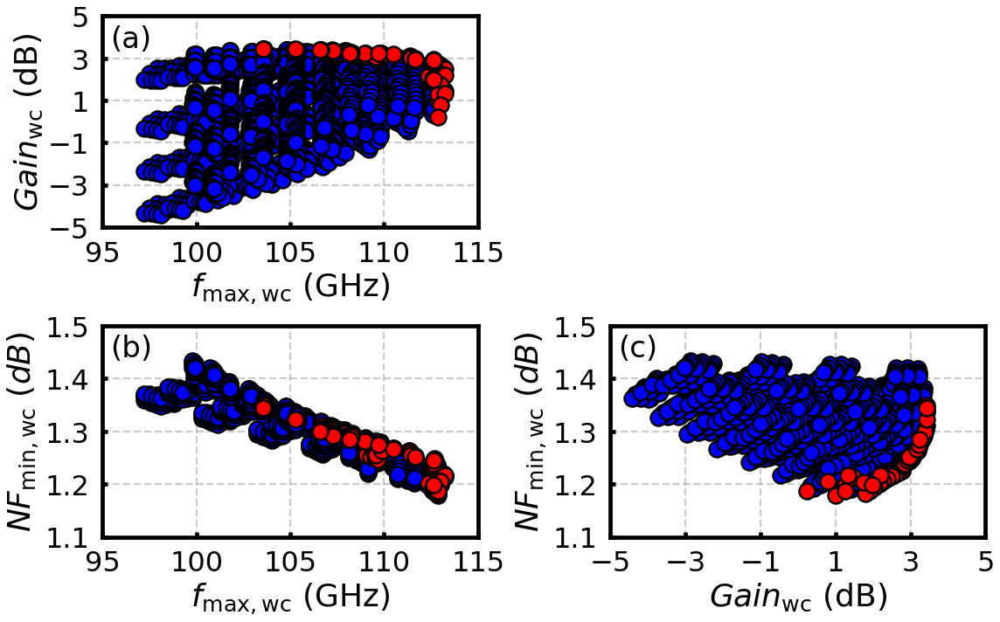

In [5]:
# Define labels
x_labels = [
    r'$f_{\mathrm{max,wc}}$ (GHz)',
    r'',
    r'$f_{\mathrm{max,wc}}$ (GHz)',
    r'$Gain_{\mathrm{wc}}$ (dB)'
]

y_labels = [
    r'$Gain_{\mathrm{wc}}$ (dB)',
    r'',
    r'$NF_{\mathrm{min,wc}}$ ($dB$)',
    r'$NF_{\mathrm{min,wc}}$ ($dB$)'
]


# Define ticks
x_ticks = [
    np.arange(95, 116, 5),
    np.arange(0, 0, 1),
    np.arange(95, 116, 5),
    np.arange(-5, 6, 2)
]

y_ticks = [
    np.arange(-5, 6, 2),
    np.arange(0, 0, 1),
    np.arange(1.1, 1.6, 0.1),
    np.arange(1.1, 1.6, 0.1)
]

# Define axis ranges
x_ranges = [
    (95, 115),
    (0, 0),
    (95, 115),
    (-5, 5)
]

y_ranges = [
    (-5, 5),
    (0, 0),
    (1.1, 1.5),
    (1.1, 1.5)
]

utils.subplot_data(
    dp=dp,
    pp=pp,
    x_labels=x_labels,
    y_labels=y_labels,
    x_ticks=x_ticks,
    y_ticks=y_ticks,
    x_ranges=x_ranges,
    y_ranges=y_ranges,
    figsize=(16, 10),
    save_path="Fig_5.pdf"  # Set to None if you don't want to save
)

In [6]:
# Define labels
x_label = r'$f_{\mathrm{max,wc}}$ (GHz)'
y_label = r'$Gain_{\mathrm{wc}}$ (dB)'
z_label = r'$NF_{\mathrm{min,wc}}$ ($dB$)'

# Define ticks
x_ticks = np.arange(95, 116, 5)
y_ticks = np.arange(-5, 6, 2)
z_ticks = np.arange(1.1, 1.6, 0.1)  

# Define axis ranges
x_range = (95, 115)
y_range = (-5, 5)
z_range = (1.1, 1.5)


# Call the function
utils.plot_pareto_frontier_3d(
    data=dp,
    pareto_front=pp,
    x_label=x_label,
    y_label=y_label,
    z_label=z_label,
    x_ticks=x_ticks,
    y_ticks=y_ticks,
    z_ticks=z_ticks,
    x_range=x_range,
    y_range=y_range,
    z_range=z_range,
    figsize=(7, 7),
    dpi=1000,
    save_path="Fig_6.pdf"  # Set to None if you don't want to save
)

In [7]:
data_attr = np.column_stack((arr_vds , arr_nfing, arr_wg, arr_gdg, arr_gsg, arr_fmax, arr_gain, arr_NF))
data_attr_pareto = data_attr[pareto_efficient]
headers = ["vds", "nfing", "wf", "gdg", "gsg", "fmax", "gain", "nf"]

df = pd.DataFrame(data_attr_pareto, columns=headers)

df.to_csv(r'./Pareto_designs/small_signal_pareto.csv', index=False)

In [8]:
logging.basicConfig(level=logging.INFO, format='%(levelname)s: %(message)s')

val_vds = np.unique(arr_vds).tolist()
val_wg = np.unique(arr_wg).tolist()
val_nfing = np.unique(arr_nfing).tolist()
val_gdg = np.unique(arr_gdg).tolist()
val_gsg = np.unique(arr_gsg).tolist()

# Define parameter configurations
params_config = {
    "vds": {
        "min": 16,
        "max": 28,
        "param_type": "int",
        "values": val_vds  
    },
    "nfing": {
        "min": 2,
        "max": 8,
        "param_type": "int",
        "values": val_nfing  
    },
    "wg": {
        "min": 25,
        "max": 100,
        "param_type": "int",
        "values": val_wg  
    },
    "gdg": {
        "min": 22,
        "max": 52,
        "param_type": "int",
        "values": val_gdg  
    },
    "gsg": {
        "min": 33,
        "max": 78,
        "param_type": "int",
        "values": val_gsg  
    }
}

data_arrays = {
    "vds": arr_vds,
    "wg": arr_wg,
    "nfing": arr_nfing,
    "gdg": arr_gdg,
    "gsg": arr_gsg,
    "fmax": arr_fmax,
    "Gain": arr_gain,
    "NF_min": arr_NF
}

INFO: Starting run 1/100
INFO: Time taken for tuning: 0.76 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 2.0, 'wg': 50.0, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 109.86889040000001, 'Gain': 3.2013222000000003, 'NF_min': 1.2661673}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.62309428
INFO: The score for trial 25 is: 0.01781167000000039
INFO: The score for trial 50 is: 0.006555479999999392
INFO: The score for trial 75 is: 0.006555479999999392
INFO: The score for trial 100 is: 0.006555479999999392
INFO: The score for trial 125 is: 0.006555479999999392
INFO: The score for trial 150 is: 0.006555479999999392
INFO: Completed run 1/100
INFO: Starting run 2/100
INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 2.0, 'wg': 50.0, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 109.83794579999999, 'Gain': 3.2180726, 'NF_min': 1.2697739}
INFO: Optimal score: 0.0
INFO: The score for trial 

INFO: The score for trial 25 is: 0.11388069499999998
INFO: The score for trial 50 is: 0.0820443750000005
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 13/100
INFO: Starting run 14/100
INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 111.393528, 'Gain': 3.126761, 'NF_min': 1.2593097}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.46968496000000004
INFO: The score for trial 25 is: 0.026785839999999617
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 14/100
INFO: Starting run 15/100
INFO: Time taken for tuning: 0.67 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing':

INFO: Completed run 25/100
INFO: Starting run 26/100
INFO: Time taken for tuning: 0.63 seconds
INFO: Best Parameters:
INFO: {'vds': 20.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 111.3289241, 'Gain': 2.9905404, 'NF_min': 1.2615775}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.2682885399999998
INFO: The score for trial 25 is: 0.03900992000000003
INFO: The score for trial 50 is: 0.03900992000000003
INFO: The score for trial 75 is: 0.0075645449999995895
INFO: The score for trial 100 is: 0.0037838399999999828
INFO: The score for trial 125 is: 0.0037838399999999828
INFO: The score for trial 150 is: 0.0037838399999999828
INFO: Completed run 26/100
INFO: Starting run 27/100
INFO: Time taken for tuning: 0.68 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 110.48644920000001, 'Gain': 3.1779147, 'NF_min': 1.2663872}
INFO: Optimal score: 0.0
I

INFO: The score for trial 25 is: 0.05644340000000003
INFO: The score for trial 50 is: 0.02079962000000035
INFO: The score for trial 75 is: 0.02079962000000035
INFO: The score for trial 100 is: 0.01049423500000013
INFO: The score for trial 125 is: 0.01049423500000013
INFO: The score for trial 150 is: 0.005650960000000538
INFO: Completed run 38/100
INFO: Starting run 39/100
INFO: Time taken for tuning: 0.65 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 110.4521673, 'Gain': 3.019957, 'NF_min': 1.2572616}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.23803306499999954
INFO: The score for trial 25 is: 0.10568379500000025
INFO: The score for trial 50 is: 0.0820443750000005
INFO: The score for trial 75 is: 0.021431240000000074
INFO: The score for trial 100 is: 0.005650960000000538
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 39/100
INFO

INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 110.4521673, 'Gain': 3.019957, 'NF_min': 1.2572616}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 1.0526672388888896
INFO: The score for trial 25 is: 0.021431240000000074
INFO: The score for trial 50 is: 0.021431240000000074
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 51/100
INFO: Starting run 52/100
INFO: Time taken for tuning: 0.74 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 111.64578030000001, 'Gain': 2.9647348, 'NF_min': 1.2518801000000002}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.7175910799999999
INFO: The score for trial 25 is: 0.01747164000000012
INFO: The score for trial 50 is: 0.01747164000000012
I

INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 63/100
INFO: Starting run 64/100
INFO: Time taken for tuning: 0.65 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 111.42592350000001, 'Gain': 3.0434442, 'NF_min': 1.2543986}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.7124733344444443
INFO: The score for trial 25 is: 0.10427798500000018
INFO: The score for trial 50 is: 0.006555479999999392
INFO: The score for trial 75 is: 0.006555479999999392
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 64/100
INFO: Starting run 65/100
INFO: Time taken for tuning: 0.66 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 110.4521673, 'Gain': 3.019957, 'NF_min': 1.2572616}
INFO:

INFO: Best Objectives:
INFO: {'fmax': 109.86889040000001, 'Gain': 3.2013222000000003, 'NF_min': 1.2661673}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.09092115499999953
INFO: The score for trial 50 is: 0.018267840000000035
INFO: The score for trial 75 is: 0.01049423500000013
INFO: The score for trial 100 is: 0.01049423500000013
INFO: The score for trial 125 is: 0.01049423500000013
INFO: The score for trial 150 is: 0.006555479999999392
INFO: Completed run 76/100
INFO: Starting run 77/100
INFO: Time taken for tuning: 0.79 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 110.4521673, 'Gain': 3.019957, 'NF_min': 1.2572616}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.25246923999999993
INFO: The score for trial 25 is: 0.05973686999999983
INFO: The score for trial 50 is: 0.05973686999999983
INFO: The score for trial 75 is: 0.02678583999

INFO: The score for trial 50 is: 0.05243749500000017
INFO: The score for trial 75 is: 0.019883794999999926
INFO: The score for trial 100 is: 0.019883794999999926
INFO: The score for trial 125 is: 0.019883794999999926
INFO: The score for trial 150 is: 0.019883794999999926
INFO: Completed run 88/100
INFO: Starting run 89/100
INFO: Time taken for tuning: 0.72 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 37.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 111.393528, 'Gain': 3.126761, 'NF_min': 1.2593097}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.43862617055555553
INFO: The score for trial 25 is: 0.09042911999999992
INFO: The score for trial 50 is: 0.09042911999999992
INFO: The score for trial 75 is: 0.010938439999999994
INFO: The score for trial 100 is: 0.010938439999999994
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 89/100
INFO: Starting run 90/100
INFO: Time taken for tuning:

INFO: Optimal score: 0.0


Saved all_score_tallies.csv to Pareto_designs/small_signal_objectives_1_results/all_score_tallies.csv
Saved mean_std_scores.csv to Pareto_designs/small_signal_objectives_1_results/mean_std_scores.csv
Saved final_scores.csv to Pareto_designs/small_signal_objectives_1_results/final_scores.csv
Saved final_statistics.csv to Pareto_designs/small_signal_objectives_1_results/final_statistics.csv


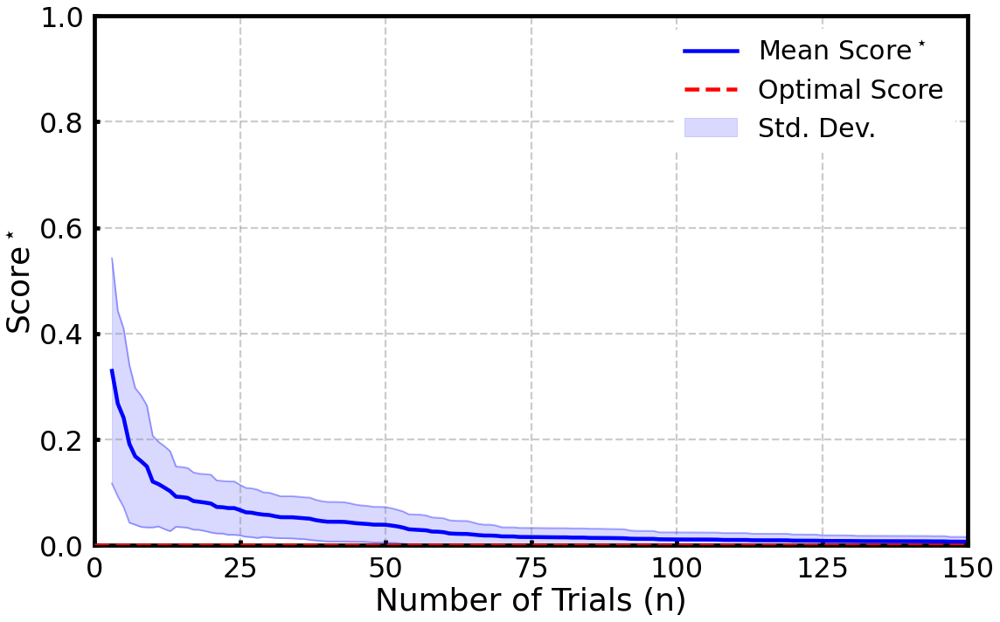

Final Score Across Runs:
Mean: 0.006
Standard Deviation: 0.0090


In [9]:
n_runs = 100 # Number of independent runs
trials = 150  # Number of trials per independent run

objectives_1 = {
    "fmax": {"target": 110, "limit": 90, "priority": 1},
    "Gain": {"target": 3, "limit": 0.5, "priority": 1},
    "NF_min": {"target": 1.3, "limit": 1.75, "priority": 1}
}

# Run multiple HOLA optimization trials
benchmark_results_1 = utils.run_multiple_hola_trials(
    n_runs=n_runs,
    trials=trials,
    objectives=objectives_1,
    tune_function=tune,
    data_arrays=data_arrays,
    params_config=params_config
)

# Save results
utils.save_results_to_csv(benchmark_results_1, output_dir=r'./Pareto_designs/small_signal_objectives_1_results')

# Plot the benchmark results
utils.plot_benchmark_results(
    mean_scores=benchmark_results_1["mean_scores"],
    std_scores=benchmark_results_1["std_scores"],
    trials=trials,
    data_arrays=data_arrays,
    objectives=objectives_1
)

# Display aggregate statistics
print(f"Final Score Across Runs:")
print(f"Mean: {benchmark_results_1['final_mean']:.3f}")
print(f"Standard Deviation: {benchmark_results_1['final_std']:.4f}")

In [10]:
check_points = [1, 30, 60, 90, 120, 150] # Trial checkpoints
tolerance = 0.05 # Tolerance from optimal score

print("=== Evaluating Mean Score* ===")
utils.evaluate_mean_scores(
    benchmark_results=benchmark_results_1,
    check_points=check_points,
)

print("\n=== Evaluating Runs Reaching Optimal Score ===")
optimal_score_1, _ = utils.evaluate_runs(
    objectives=objectives_1,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_1,
    check_points=check_points,
    tolerance=None,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

print("\n=== Evaluating Runs Within Tolerance of Optimal Score ===")
optimal_score_1, threshold = utils.evaluate_runs(
    objectives=objectives_1,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_1,
    check_points=check_points,
    tolerance=tolerance,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

INFO: Optimal score: 0.0
INFO: Optimal score: 0.0


=== Evaluating Mean Score* ===
After 1 trials, the Mean Score: inf
After 30 trials, the Mean Score: 0.057
After 60 trials, the Mean Score: 0.024
After 90 trials, the Mean Score: 0.013
After 120 trials, the Mean Score: 0.008
After 150 trials, the Mean Score: 0.006

=== Evaluating Runs Reaching Optimal Score ===
After 1 trials, 0 out of 100 runs reached the optimal score.
After 30 trials, 6 out of 100 runs reached the optimal score.
After 60 trials, 18 out of 100 runs reached the optimal score.
After 90 trials, 34 out of 100 runs reached the optimal score.
After 120 trials, 47 out of 100 runs reached the optimal score.
After 150 trials, 52 out of 100 runs reached the optimal score.

=== Evaluating Runs Within Tolerance of Optimal Score ===
After 1 trials, 1 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 30 trials, 50 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 60 trials, 84 out of 100 runs are within 5.0% of the opt

INFO: Starting run 1/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 26.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 106.62592140000001, 'Gain': 3.4120461000000004, 'NF_min': 1.3064026000000002}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.15825837499999995
INFO: The score for trial 50 is: 0.15825837499999995
INFO: The score for trial 75 is: 0.061876791666666486
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 1/100
INFO: Starting run 2/100
INFO: Time taken for tuning: 0.82 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 108.0331759, 'Gain': 3.3313493999999997, 'NF_min': 1.2875244}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.120

INFO: The score for trial 150 is: 0.0
INFO: Completed run 13/100
INFO: Starting run 14/100
INFO: Time taken for tuning: 0.75 seconds
INFO: Best Parameters:
INFO: {'vds': 26.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 106.585471, 'Gain': 3.3936277, 'NF_min': 1.2991487}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.4544527083333333
INFO: The score for trial 25 is: 0.2758913333333335
INFO: The score for trial 50 is: 0.04566624999999991
INFO: The score for trial 75 is: 0.023596750000000055
INFO: The score for trial 100 is: 0.023596750000000055
INFO: The score for trial 125 is: 0.011330311666666537
INFO: The score for trial 150 is: 0.0026551249999998694
INFO: Completed run 14/100
INFO: Starting run 15/100
INFO: Time taken for tuning: 0.72 seconds
INFO: Best Parameters:
INFO: {'vds': 26.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 106.62592140000001, 'Gain': 3.4120461000000004, 'NF_m

INFO: The score for trial 1 is: 0.21211954166666658
INFO: The score for trial 25 is: 0.0
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 26/100
INFO: Starting run 27/100
INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 24.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 107.2193602, 'Gain': 3.3886586000000003, 'NF_min': 1.3034578}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.573194125
INFO: The score for trial 25 is: 0.0712090833333332
INFO: The score for trial 50 is: 0.0712090833333332
INFO: The score for trial 75 is: 0.0712090833333332
INFO: The score for trial 100 is: 0.061876791666666486
INFO: The score for trial 125 is: 0.023620125000000103
INFO: The score for trial 150 is: 0.004725583333333172
INFO: Completed run 27/100
INFO: Starting r

INFO: Starting run 39/100
INFO: Time taken for tuning: 0.71 seconds
INFO: Best Parameters:
INFO: {'vds': 20.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 107.53541820000001, 'Gain': 3.244204, 'NF_min': 1.2980243}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.1166734583333332
INFO: The score for trial 50 is: 0.1166734583333332
INFO: The score for trial 75 is: 0.08879320833333337
INFO: The score for trial 100 is: 0.08879320833333337
INFO: The score for trial 125 is: 0.06491500000000006
INFO: The score for trial 150 is: 0.06491500000000006
INFO: Completed run 39/100
INFO: Starting run 40/100
INFO: Time taken for tuning: 0.71 seconds
INFO: Best Parameters:
INFO: {'vds': 28.0, 'nfing': 2.0, 'wg': 50.0, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 106.85485249999999, 'Gain': 3.2565907000000003, 'NF_min': 1.3006405}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.6322

INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.4698439166666666
INFO: The score for trial 25 is: 0.004725583333333172
INFO: The score for trial 50 is: 0.004725583333333172
INFO: The score for trial 75 is: 0.004725583333333172
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 51/100
INFO: Starting run 52/100
INFO: Time taken for tuning: 0.68 seconds
INFO: Best Parameters:
INFO: {'vds': 26.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 106.6067365, 'Gain': 3.4024385, 'NF_min': 1.3023788}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.27616904666666664
INFO: The score for trial 25 is: 0.17606716666666666
INFO: The score for trial 50 is: 0.08157712500000003
INFO: The score for trial 75 is: 0.0286044166666668
INFO: The score for trial 100 is: 0.018323624999999955
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
I

INFO: Best Objectives:
INFO: {'fmax': 107.2556507, 'Gain': 3.3765648, 'NF_min': 1.2983854}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.13758187499999996
INFO: The score for trial 50 is: 0.08895337500000011
INFO: The score for trial 75 is: 0.020960083333333435
INFO: The score for trial 100 is: 0.01813412499999978
INFO: The score for trial 125 is: 0.009764666666666533
INFO: The score for trial 150 is: 0.009764666666666533
INFO: Completed run 64/100
INFO: Starting run 65/100
INFO: Time taken for tuning: 0.63 seconds
INFO: Best Parameters:
INFO: {'vds': 26.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 106.585471, 'Gain': 3.3936277, 'NF_min': 1.2991487}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.098701273333333
INFO: The score for trial 50 is: 0.098701273333333
INFO: The score for trial 75 is: 0.011330311666666537
INFO: The score for trial 1

INFO: The score for trial 100 is: 0.014258749999999876
INFO: The score for trial 125 is: 0.0026551249999998694
INFO: The score for trial 150 is: 0.0
INFO: Completed run 76/100
INFO: Starting run 77/100
INFO: Time taken for tuning: 0.67 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 108.0331759, 'Gain': 3.3313493999999997, 'NF_min': 1.2875244}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.2381627500000002
INFO: The score for trial 25 is: 0.09384083333333326
INFO: The score for trial 50 is: 0.07663741666666646
INFO: The score for trial 75 is: 0.07663741666666646
INFO: The score for trial 100 is: 0.07663741666666646
INFO: The score for trial 125 is: 0.0286044166666668
INFO: The score for trial 150 is: 0.0286044166666668
INFO: Completed run 77/100
INFO: Starting run 78/100
INFO: Time taken for tuning: 0.71 seconds
INFO: Best Parameters:
INFO: {'vds': 28.0, 'nfing': 2.0, 'wg': 50.0, 'g

INFO: {'vds': 28.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 105.1705822, 'Gain': 3.4012084000000002, 'NF_min': 1.3096359}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.0682711250000001
INFO: The score for trial 25 is: 0.0682711250000001
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 89/100
INFO: Starting run 90/100
INFO: Time taken for tuning: 0.68 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 2.0, 'wg': 62.5, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 107.8952155, 'Gain': 3.35698, 'NF_min': 1.2958366000000001}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.6313225
INFO: The score for trial 25 is: 0.09576041666666668
INFO: The score for trial 50 is: 0.09576041666666668
INFO: The score for trial 75 is: 0.0236201250000001

Saved all_score_tallies.csv to Pareto_designs/small_signal_objectives_2_results/all_score_tallies.csv
Saved mean_std_scores.csv to Pareto_designs/small_signal_objectives_2_results/mean_std_scores.csv
Saved final_scores.csv to Pareto_designs/small_signal_objectives_2_results/final_scores.csv
Saved final_statistics.csv to Pareto_designs/small_signal_objectives_2_results/final_statistics.csv


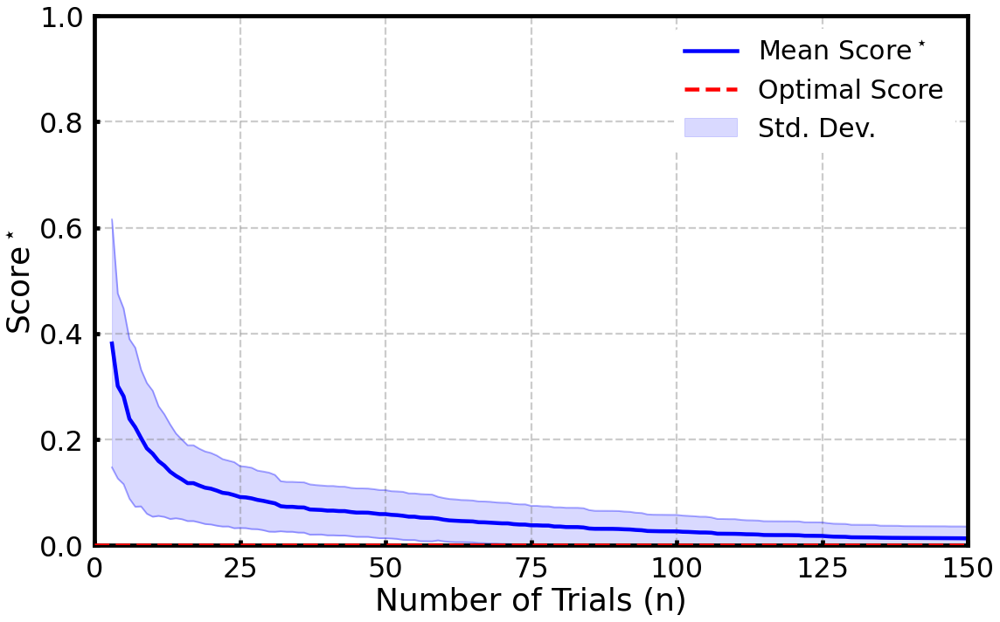

Final Score Across Runs:
Mean: 0.012
Standard Deviation: 0.0225


In [11]:
n_runs = 100 # Number of independent runs
trials = 150  # Number of trials per independent run

objectives_2 = {
    "fmax": {"target": 105, "limit": 90, "priority": 1},
    "Gain": {"target": 3.4, "limit": 1, "priority": 1},
    "NF_min": {"target": 1.35, "limit": 1.75, "priority": 1}
}

# Run multiple HOLA optimization trials
benchmark_results_2 = utils.run_multiple_hola_trials(
    n_runs=n_runs,
    trials=trials,
    objectives=objectives_2,
    tune_function=tune,
    data_arrays=data_arrays,
    params_config=params_config
)

# Save results
utils.save_results_to_csv(benchmark_results_2, output_dir=r'./Pareto_designs/small_signal_objectives_2_results')

# Plot the benchmark results
utils.plot_benchmark_results(
    mean_scores=benchmark_results_2["mean_scores"],
    std_scores=benchmark_results_2["std_scores"],
    trials=trials,
    data_arrays=data_arrays,
    objectives=objectives_2
)

# Display aggregate statistics
print(f"Final Score Across Runs:")
print(f"Mean: {benchmark_results_2['final_mean']:.3f}")
print(f"Standard Deviation: {benchmark_results_2['final_std']:.4f}")

In [12]:
check_points = [1, 30, 60, 90, 120, 150] # Trial checkpoints
tolerance = 0.05 # Tolerance from optimal score

print("\n=== Evaluating Mean Score* ===")
utils.evaluate_mean_scores(
    benchmark_results=benchmark_results_2,
    check_points=check_points,
)

print("\n=== Evaluating Runs Reaching Optimal Score ===")
optimal_score_2, _ = utils.evaluate_runs(
    objectives=objectives_2,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_2,
    check_points=check_points,
    tolerance=None,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

print("\n=== Evaluating Runs Within Tolerance of Optimal Score ===")
utils.optimal_score_2, threshold = utils.evaluate_runs(
    objectives=objectives_2,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_2,
    check_points=check_points,
    tolerance=tolerance,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

INFO: Optimal score: 0.0
INFO: Optimal score: 0.0



=== Evaluating Mean Score* ===
After 1 trials, the Mean Score: inf
After 30 trials, the Mean Score: 0.081
After 60 trials, the Mean Score: 0.048
After 90 trials, the Mean Score: 0.030
After 120 trials, the Mean Score: 0.018
After 150 trials, the Mean Score: 0.012

=== Evaluating Runs Reaching Optimal Score ===
After 1 trials, 0 out of 100 runs reached the optimal score.
After 30 trials, 10 out of 100 runs reached the optimal score.
After 60 trials, 19 out of 100 runs reached the optimal score.
After 90 trials, 29 out of 100 runs reached the optimal score.
After 120 trials, 40 out of 100 runs reached the optimal score.
After 150 trials, 53 out of 100 runs reached the optimal score.

=== Evaluating Runs Within Tolerance of Optimal Score ===
After 1 trials, 1 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 30 trials, 28 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 60 trials, 52 out of 100 runs are within 5.0% of the o

INFO: Starting run 1/100
INFO: Time taken for tuning: 0.74 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 112.64662279999999, 'Gain': 2.3530377000000002, 'NF_min': 1.2176746}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.17444086911568585
INFO: The score for trial 50 is: 0.026013773241852653
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 1/100
INFO: Starting run 2/100
INFO: Time taken for tuning: 0.66 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 112.64290249999999, 'Gain': 2.449551, 'NF_min': 1.2220723999999998}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.014029622641509518
INF

INFO: The score for trial 75 is: 0.013722163522012732
INFO: The score for trial 100 is: 0.013722163522012732
INFO: The score for trial 125 is: 0.0018562264150943002
INFO: The score for trial 150 is: 0.0018562264150943002
INFO: Completed run 13/100
INFO: Starting run 14/100
INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.2528358, 'Gain': 2.5039217000000002, 'NF_min': 1.2149732}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.0
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 14/100
INFO: Starting run 15/100
INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 48.0}
INFO: Best Ob

INFO: {'fmax': 112.51495829999999, 'Gain': 2.4251015, 'NF_min': 1.2185}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.08003530754717025
INFO: The score for trial 50 is: 0.07775938130360238
INFO: The score for trial 75 is: 0.05923512864494023
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 26/100
INFO: Starting run 27/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.2528358, 'Gain': 2.5039217000000002, 'NF_min': 1.2149732}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.0319609433962264
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INF

INFO: Starting run 39/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 18.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 112.51495829999999, 'Gain': 2.4251015, 'NF_min': 1.2185}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.17343532289879873
INFO: The score for trial 25 is: 0.05923512864494023
INFO: The score for trial 50 is: 0.05923512864494023
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 39/100
INFO: Starting run 40/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 112.986799, 'Gain': 2.453375, 'NF_min': 1.2225663}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.4361502368972744
INFO: The score for trial 25 is: 0.0818865150085766
I

INFO: The score for trial 150 is: 0.0
INFO: Completed run 51/100
INFO: Starting run 52/100
INFO: Time taken for tuning: 0.72 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 52.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 112.56740520000001, 'Gain': 2.3487343, 'NF_min': 1.2209838}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.17632401868686887
INFO: The score for trial 25 is: 0.02596007272727209
INFO: The score for trial 50 is: 0.02596007272727209
INFO: The score for trial 75 is: 0.018658113207547438
INFO: The score for trial 100 is: 0.0018562264150943002
INFO: The score for trial 125 is: 0.0018562264150943002
INFO: The score for trial 150 is: 0.0018562264150943002
INFO: Completed run 52/100
INFO: Starting run 53/100
INFO: Time taken for tuning: 0.68 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 112.9087245, 'Gain': 2.2714587, 'NF_min':

INFO: The score for trial 1 is: 0.14273295977701542
INFO: The score for trial 25 is: 0.013722163522012732
INFO: The score for trial 50 is: 0.013722163522012732
INFO: The score for trial 75 is: 0.013722163522012732
INFO: The score for trial 100 is: 0.006259811320754677
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 64/100
INFO: Starting run 65/100
INFO: Time taken for tuning: 0.77 seconds
INFO: Best Parameters:
INFO: {'vds': 20.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 52.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 112.4911287, 'Gain': 2.2609287, 'NF_min': 1.2226788}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.34024076205450726
INFO: The score for trial 25 is: 0.1017578138078897
INFO: The score for trial 50 is: 0.06604554802744439
INFO: The score for trial 75 is: 0.04219644444444426
INFO: The score for trial 100 is: 0.04219644444444426
INFO: The score for trial 125 is: 0.026760617400419146
INFO: The score for trial 150 

INFO: Time taken for tuning: 0.70 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 112.76304669999999, 'Gain': 2.7881562, 'NF_min': 1.2255818}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.07775938130360238
INFO: The score for trial 50 is: 0.07775938130360238
INFO: The score for trial 75 is: 0.06939128252334745
INFO: The score for trial 100 is: 0.03362380686106328
INFO: The score for trial 125 is: 0.03362380686106328
INFO: The score for trial 150 is: 0.0105316981132077
INFO: Completed run 77/100
INFO: Starting run 78/100
INFO: Time taken for tuning: 0.71 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 52.0, 'gsg': 33.0}
INFO: Best Objectives:
INFO: {'fmax': 112.56740520000001, 'Gain': 2.3487343, 'NF_min': 1.2209838}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.

INFO: Best Objectives:
INFO: {'fmax': 112.51495829999999, 'Gain': 2.4251015, 'NF_min': 1.2185}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.2209853787307035
INFO: The score for trial 25 is: 0.061217772212692506
INFO: The score for trial 50 is: 0.01867679245283005
INFO: The score for trial 75 is: 0.018658113207547438
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 89/100
INFO: Starting run 90/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 22.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 112.64662279999999, 'Gain': 2.3530377000000002, 'NF_min': 1.2176746}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.0
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The

Saved all_score_tallies.csv to Pareto_designs/small_signal_objectives_3_results/all_score_tallies.csv
Saved mean_std_scores.csv to Pareto_designs/small_signal_objectives_3_results/mean_std_scores.csv
Saved final_scores.csv to Pareto_designs/small_signal_objectives_3_results/final_scores.csv
Saved final_statistics.csv to Pareto_designs/small_signal_objectives_3_results/final_statistics.csv


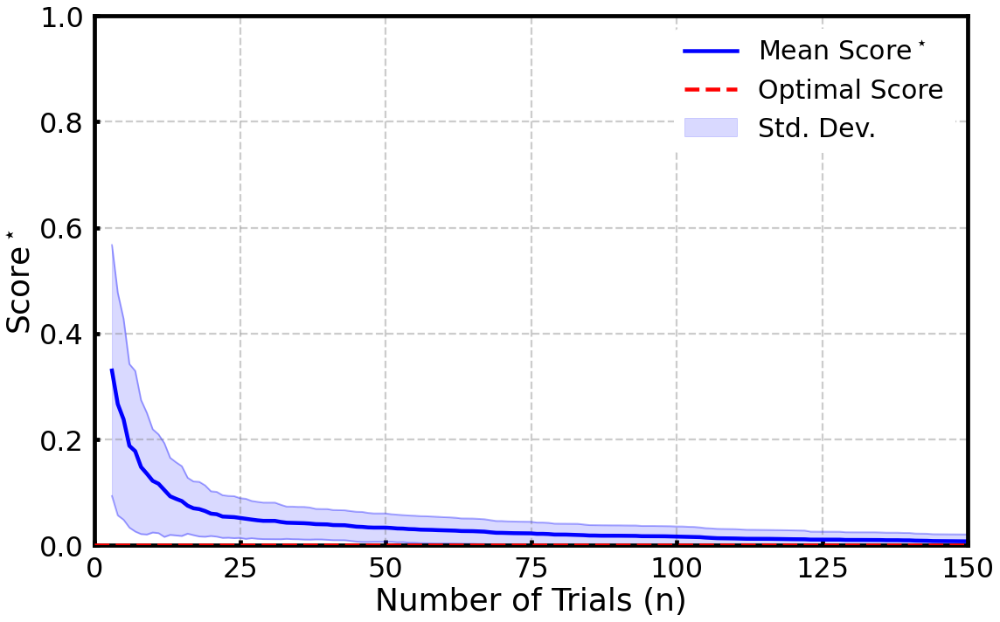

Final Score Across Runs:
Mean: 0.007
Standard Deviation: 0.0130


In [13]:
n_runs = 100 # Number of independent runs
trials = 150  # Number of trials per independent run

objectives_3 = {
    "fmax": {"target": 112, "limit": 90, "priority": 1},
    "Gain": {"target": 2.3, "limit": 0.5, "priority": 1},
    "NF_min": {"target": 1.22, "limit": 1.75, "priority": 1}
}

# Run multiple HOLA optimization trials
benchmark_results_3 = utils.run_multiple_hola_trials(
    n_runs=n_runs,
    trials=trials,
    objectives=objectives_3,
    tune_function=tune,
    data_arrays=data_arrays,
    params_config=params_config
)

# Save results
utils.save_results_to_csv(benchmark_results_3, output_dir=r'./Pareto_designs/small_signal_objectives_3_results')

# Plot the benchmark results
utils.plot_benchmark_results(
    mean_scores=benchmark_results_3["mean_scores"],
    std_scores=benchmark_results_3["std_scores"],
    trials=trials,
    data_arrays=data_arrays,
    objectives=objectives_3
)

# Display aggregate statistics
print(f"Final Score Across Runs:")
print(f"Mean: {benchmark_results_3['final_mean']:.3f}")
print(f"Standard Deviation: {benchmark_results_3['final_std']:.4f}")

In [14]:
check_points = [1, 30, 60, 90, 120, 150] # Trial checkpoints
tolerance = 0.05 # Tolerance from optimal score

print("=== Evaluating Mean Score* ===")
utils.evaluate_mean_scores(
    benchmark_results=benchmark_results_3,
    check_points=check_points,
)

print("\n=== Evaluating Runs Reaching Optimal Score ===")
optimal_score_3, _ = utils.evaluate_runs(
    objectives=objectives_3,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_3,
    check_points=check_points,
    tolerance=None,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

print("\n=== Evaluating Runs Within Tolerance of Optimal Score ===")
optimal_score_3, threshold = utils.evaluate_runs(
    objectives=objectives_3,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_3,
    check_points=check_points,
    tolerance=tolerance,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

INFO: Optimal score: 0.0
INFO: Optimal score: 0.0


=== Evaluating Mean Score* ===
After 1 trials, the Mean Score: inf
After 30 trials, the Mean Score: 0.046
After 60 trials, the Mean Score: 0.028
After 90 trials, the Mean Score: 0.017
After 120 trials, the Mean Score: 0.011
After 150 trials, the Mean Score: 0.007

=== Evaluating Runs Reaching Optimal Score ===
After 1 trials, 0 out of 100 runs reached the optimal score.
After 30 trials, 10 out of 100 runs reached the optimal score.
After 60 trials, 16 out of 100 runs reached the optimal score.
After 90 trials, 30 out of 100 runs reached the optimal score.
After 120 trials, 45 out of 100 runs reached the optimal score.
After 150 trials, 59 out of 100 runs reached the optimal score.

=== Evaluating Runs Within Tolerance of Optimal Score ===
After 1 trials, 3 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 30 trials, 58 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 60 trials, 77 out of 100 runs are within 5.0% of the op

INFO: Starting run 1/100
INFO: Time taken for tuning: 0.71 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 2.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 112.97925009999999, 'Gain': 1.5321122, 'NF_min': 1.2194268999999998}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.6642400140278919
INFO: The score for trial 25 is: 0.020834015504512526
INFO: The score for trial 50 is: 0.020834015504512526
INFO: The score for trial 75 is: 0.020834015504512526
INFO: The score for trial 100 is: 0.002774763494668376
INFO: The score for trial 125 is: 0.0009021695652179362
INFO: The score for trial 150 is: 0.0009021695652179362
INFO: Completed run 1/100
INFO: Starting run 2/100
INFO: Time taken for tuning: 0.83 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.03196499999999, 'Gain': 2.1717687000000003, 'NF_min': 1.2009048}
INFO: Optimal score: 0.0
INFO: 

INFO: The score for trial 25 is: 0.03337924347826082
INFO: The score for trial 50 is: 0.018027759474979206
INFO: The score for trial 75 is: 0.018027759474979206
INFO: The score for trial 100 is: 0.018027759474979206
INFO: The score for trial 125 is: 0.0009021695652179362
INFO: The score for trial 150 is: 0.0009021695652179362
INFO: Completed run 13/100
INFO: Starting run 14/100
INFO: Time taken for tuning: 0.76 seconds
INFO: Best Parameters:
INFO: {'vds': 18.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 112.8449676, 'Gain': 2.5533046, 'NF_min': 1.2233177}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.12930990123051705
INFO: The score for trial 25 is: 0.049695652912222915
INFO: The score for trial 50 is: 0.049695652912222915
INFO: The score for trial 75 is: 0.04203360705496343
INFO: The score for trial 100 is: 0.04203360705496343
INFO: The score for trial 125 is: 0.030099731337161803
INFO: The score for trial 150 is: 0.01300035

INFO: {'vds': 16.0, 'nfing': 2.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 113.13205890000002, 'Gain': 1.5018556, 'NF_min': 1.2159672}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.049976346759639224
INFO: The score for trial 50 is: 0.049976346759639224
INFO: The score for trial 75 is: 0.003968499999999819
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 26/100
INFO: Starting run 27/100
INFO: Time taken for tuning: 0.72 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 48.0}
INFO: Best Objectives:
INFO: {'fmax': 112.7475706, 'Gain': 2.0335631000000003, 'NF_min': 1.2118649}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.2321558513535683
INFO: The score for trial 25 is: 0.017385256521740056
INFO: The score for trial 50 is: 0.017385256521740056
INFO: The score for

INFO: The score for trial 125 is: 0.003968499999999819
INFO: The score for trial 150 is: 0.003968499999999819
INFO: Completed run 38/100
INFO: Starting run 39/100
INFO: Time taken for tuning: 0.68 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 113.13952040000001, 'Gain': 2.3227147, 'NF_min': 1.2192938}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score for trial 25 is: 0.01595320262510331
INFO: The score for trial 50 is: 0.0
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 39/100
INFO: Starting run 40/100
INFO: Time taken for tuning: 0.67 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.03358349999999, 'Gain': 1.7485043999999998, 'NF_min': 1.203767}
INFO

INFO: The score for trial 25 is: 0.018158565217391454
INFO: The score for trial 50 is: 0.018158565217391454
INFO: The score for trial 75 is: 0.018158565217391454
INFO: The score for trial 100 is: 0.014412152173912451
INFO: The score for trial 125 is: 0.010835752173912971
INFO: The score for trial 150 is: 0.010835752173912971
INFO: Completed run 51/100
INFO: Starting run 52/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 113.13791090000002, 'Gain': 2.5913015, 'NF_min': 1.2177373}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.9903964014766208
INFO: The score for trial 25 is: 0.05496846193601344
INFO: The score for trial 50 is: 0.04999306587366682
INFO: The score for trial 75 is: 0.04999306587366682
INFO: The score for trial 100 is: 0.03280186636587368
INFO: The score for trial 125 is: 0.03280186636587368
INFO: The score for trial 150 is: 0.0
INFO

INFO: The score for trial 100 is: 0.0009021695652179362
INFO: The score for trial 125 is: 0.0009021695652179362
INFO: The score for trial 150 is: 0.0
INFO: Completed run 63/100
INFO: Starting run 64/100
INFO: Time taken for tuning: 0.73 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 63.0}
INFO: Best Objectives:
INFO: {'fmax': 112.9103629, 'Gain': 1.8866539, 'NF_min': 1.2074145}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.04999306587366682
INFO: The score for trial 25 is: 0.04999306587366682
INFO: The score for trial 50 is: 0.021219573913043632
INFO: The score for trial 75 is: 0.02108876956521788
INFO: The score for trial 100 is: 0.011047113043477719
INFO: The score for trial 125 is: 0.0038972652173915323
INFO: The score for trial 150 is: 0.0038972652173915323
INFO: Completed run 64/100
INFO: Starting run 65/100
INFO: Time taken for tuning: 0.72 seconds
INFO: Best Parameters:
INFO: {'vds': 20.0, 'nfing': 4.0, 'wg': 25.0, '

INFO: Completed run 75/100
INFO: Starting run 76/100
INFO: Time taken for tuning: 0.66 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.03358349999999, 'Gain': 1.7485043999999998, 'NF_min': 1.203767}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.5458218782608698
INFO: The score for trial 25 is: 0.013000350451189274
INFO: The score for trial 50 is: 0.0038972652173915323
INFO: The score for trial 75 is: 0.0
INFO: The score for trial 100 is: 0.0
INFO: The score for trial 125 is: 0.0
INFO: The score for trial 150 is: 0.0
INFO: Completed run 76/100
INFO: Starting run 77/100
INFO: Time taken for tuning: 0.64 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 22.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.2528358, 'Gain': 2.5039217000000002, 'NF_min': 1.2149732}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: inf
INFO: The score f

INFO: The score for trial 150 is: 0.0
INFO: Completed run 88/100
INFO: Starting run 89/100
INFO: Time taken for tuning: 0.69 seconds
INFO: Best Parameters:
INFO: {'vds': 20.0, 'nfing': 6.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 112.76969199999999, 'Gain': 1.9228538, 'NF_min': 1.2231481000000002}
INFO: Optimal score: 0.0
INFO: The score for trial 1 is: 0.09824449524200142
INFO: The score for trial 25 is: 0.05277050360951609
INFO: The score for trial 50 is: 0.050746549466775454
INFO: The score for trial 75 is: 0.01595320262510331
INFO: The score for trial 100 is: 0.01595320262510331
INFO: The score for trial 125 is: 0.01595320262510331
INFO: The score for trial 150 is: 0.01595320262510331
INFO: Completed run 89/100
INFO: Starting run 90/100
INFO: Time taken for tuning: 0.66 seconds
INFO: Best Parameters:
INFO: {'vds': 16.0, 'nfing': 4.0, 'wg': 25.0, 'gdg': 37.0, 'gsg': 78.0}
INFO: Best Objectives:
INFO: {'fmax': 113.03196499999999, 'Gain': 2.17176870

INFO: Optimal score: 0.0


Saved all_score_tallies.csv to Pareto_designs/small_signal_objectives_4_results/all_score_tallies.csv
Saved mean_std_scores.csv to Pareto_designs/small_signal_objectives_4_results/mean_std_scores.csv
Saved final_scores.csv to Pareto_designs/small_signal_objectives_4_results/final_scores.csv
Saved final_statistics.csv to Pareto_designs/small_signal_objectives_4_results/final_statistics.csv


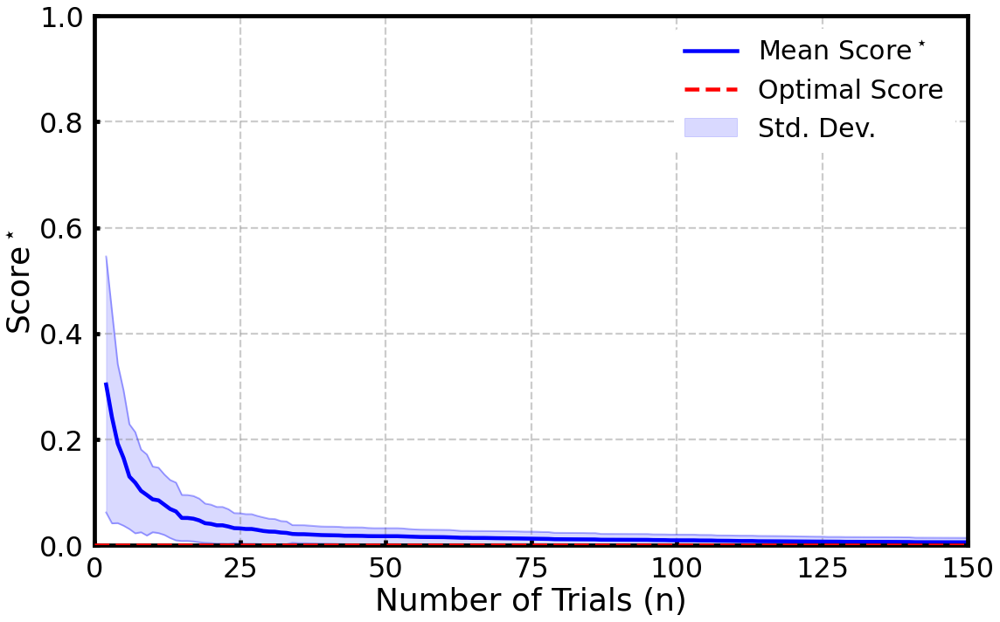

Final Score Across Runs:
Mean: 0.005
Standard Deviation: 0.0084


In [15]:
n_runs = 100 # Number of independent runs
trials = 150  # Number of trials per independent run

objectives_4 = {
    "fmax": {"target": 113, "limit": 90, "priority": 1},
    "Gain": {"target": 1.5, "limit": 0.5, "priority": 1},
    "NF_min": {"target": 1.22, "limit": 1.75, "priority": 1}
}


# Run multiple HOLA optimization trials
benchmark_results_4 = utils.run_multiple_hola_trials(
    n_runs=n_runs,
    trials=trials,
    objectives=objectives_4,
    tune_function=tune,
    data_arrays=data_arrays,
    params_config=params_config
)

# Save results
utils.save_results_to_csv(benchmark_results_4, output_dir=r'./Pareto_designs/small_signal_objectives_4_results')

# Plot the benchmark results
utils.plot_benchmark_results(
    mean_scores=benchmark_results_4["mean_scores"],
    std_scores=benchmark_results_4["std_scores"],
    trials=trials,
    data_arrays=data_arrays,
    objectives=objectives_4
)

# Display aggregate statistics
print(f"Final Score Across Runs:")
print(f"Mean: {benchmark_results_4['final_mean']:.3f}")
print(f"Standard Deviation: {benchmark_results_4['final_std']:.4f}")

In [16]:
check_points = [1, 30, 60, 90, 120, 150] # Trial checkpoints
tolerance = 0.05 # Tolerance from optimal score

print("=== Evaluating Mean Score* ===")
utils.evaluate_mean_scores(
    benchmark_results=benchmark_results_4,
    check_points=check_points,
)

print("\n=== Evaluating Runs Reaching Optimal Score ===")
optimal_score_4, _ = utils.evaluate_runs(
    objectives=objectives_4,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_4,
    check_points=check_points,
    tolerance=None,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

print("\n=== Evaluating Runs Within Tolerance of Optimal Score ===")
optimal_score_4, threshold = utils.evaluate_runs(
    objectives=objectives_4,
    data_arrays=data_arrays,
    benchmark_results=benchmark_results_4,
    check_points=check_points,
    tolerance=tolerance,
    compute_threshold_func=utils.compute_threshold,
    score_calculation_func=utils.calculate_score
)

INFO: Optimal score: 0.0
INFO: Optimal score: 0.0


=== Evaluating Mean Score* ===
After 1 trials, the Mean Score: inf
After 30 trials, the Mean Score: 0.025
After 60 trials, the Mean Score: 0.015
After 90 trials, the Mean Score: 0.010
After 120 trials, the Mean Score: 0.007
After 150 trials, the Mean Score: 0.005

=== Evaluating Runs Reaching Optimal Score ===
After 1 trials, 0 out of 100 runs reached the optimal score.
After 30 trials, 9 out of 100 runs reached the optimal score.
After 60 trials, 19 out of 100 runs reached the optimal score.
After 90 trials, 36 out of 100 runs reached the optimal score.
After 120 trials, 46 out of 100 runs reached the optimal score.
After 150 trials, 56 out of 100 runs reached the optimal score.

=== Evaluating Runs Within Tolerance of Optimal Score ===
After 1 trials, 7 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 30 trials, 88 out of 100 runs are within 5.0% of the optimal score (optimal_score=0.000).
After 60 trials, 97 out of 100 runs are within 5.0% of the opt

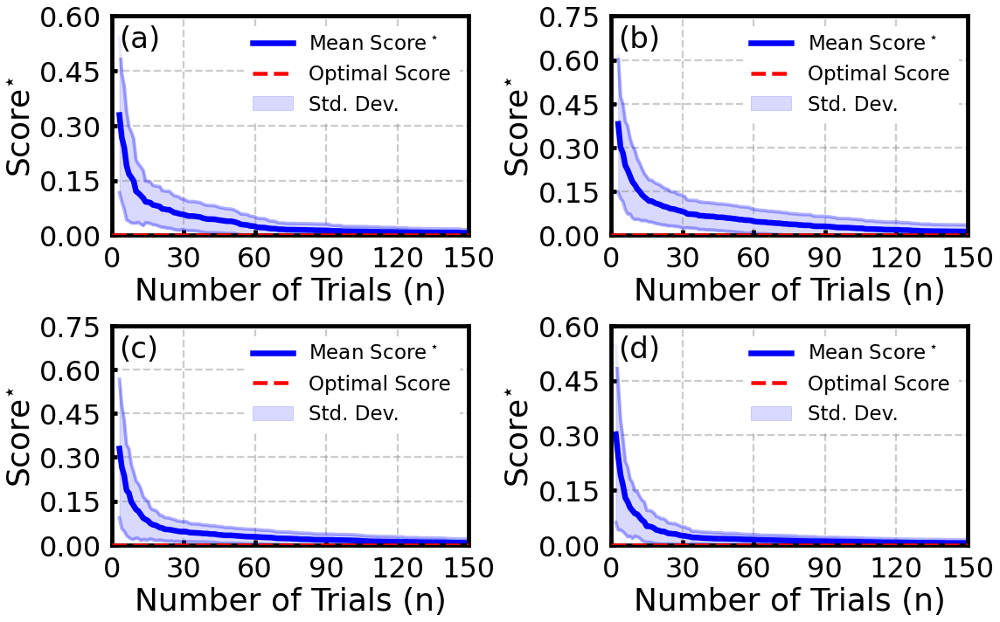

In [17]:
# Data for plotting (mean and standard deviation)
benchmark_results_1 = {
    "mean_scores": benchmark_results_1["mean_scores"],
    "std_scores": benchmark_results_1["std_scores"]
}
benchmark_results_2 = {
    "mean_scores": benchmark_results_2["mean_scores"],
    "std_scores": benchmark_results_2["std_scores"]
}
benchmark_results_3 = {
    "mean_scores": benchmark_results_3["mean_scores"],
    "std_scores": benchmark_results_3["std_scores"]
}
benchmark_results_4 = {
    "mean_scores": benchmark_results_4["mean_scores"],
    "std_scores": benchmark_results_4["std_scores"]
}

benchmark_results = [
    benchmark_results_1,
    benchmark_results_2,
    benchmark_results_3,
    benchmark_results_4
]

# Optimal scores for each subplot
optimal_scores = [optimal_score_1, optimal_score_2, optimal_score_3, optimal_score_4]

# Define labels
x_labels = [
    r'Number of Trials (n)',
    r'Number of Trials (n)',
    r'Number of Trials (n)',
    r'Number of Trials (n)'
]

y_labels = [
    r'Score$^{\star}$',
    r'Score$^{\star}$',
    r'Score$^{\star}$',
    r'Score$^{\star}$'
]

# Define ticks
x_ticks = [
    np.arange(0, trials + 1, 30),
    np.arange(0, trials + 1, 30),
    np.arange(0, trials + 1, 30),
    np.arange(0, trials + 1, 30)
]

utils.subplot_benchmark_results(
    trials=trials,
    benchmark_results=benchmark_results,
    optimal_scores=optimal_scores,
    x_labels=x_labels,
    y_labels=y_labels,
    x_ticks=x_ticks,
    figsize=(16, 10),
    save_path="Fig_7.pdf"  # Set to None if you don't want to save
)